In [16]:
%matplotlib inline
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image, ImageOps, ImageFilter
from scipy.ndimage.filters import laplace, generic_filter
from scipy.ndimage import (gaussian_gradient_magnitude, sobel,
                           maximum_filter, gaussian_laplace)

from dataset_utils import grid_plot, load_img
import dataset_utils as utils

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = [16, 9]

In [22]:
FILES_PER_CLASS = 100
IMG_SIZE = (1200, 900)
TAG_MARGIN = 50

## data sources

In [23]:
old_data_dir = '/net/people/plgmatisz/antibodies/data/antibodies/original/'
new_data_dir = '/net/people/plgmatisz/antibodies/data/antibodies_new_files/'

os.listdir(old_data_dir) + os.listdir(new_data_dir)

['negatives',
 'AMA',
 'nucleolar',
 'ziarnisty+homogenny',
 'ACA',
 'ziarnisty',
 'fibrilar',
 'ziarnisty+nucleolar',
 'homogenous',
 'ziarnisty+cytoplazmatyczny',
 'nuclear_dots',
 'ziarnisty + cytoplazmatyczny',
 'inne',
 'ziarnisty + homogenny + jaderkowy',
 'ziarnisty + homogenny',
 'ziarnisty + dodatnia  strefa podz',
 'nucleolar',
 'ACA',
 'ziarnisty',
 'homogenous',
 'ziarnisty + nucleolar',
 'nucleolar_dots']

In [41]:
class_source = {
    'ACA': ('ACA', 'ACA'),
    'HOM': ('homogenous', 'homogenous'),
    'ZIA': ('ziarnisty', 'ziarnisty'),
    'NUC': ('nucleolar', 'nucleolar'),
#     'DOT': ('nuclear_dots', 'nucleolar_dots')
}
class_files = {}

for name, source in class_source.items():
    old_files = glob.glob(f'{old_data_dir}/{source[0]}/*.*')
    new_files = glob.glob(f'{new_data_dir}/{source[1]}/*.*')
    print(f'{name}:\n old files count = {len(old_files)}\n new_files_count = {len(new_files)}')
    print(f' total: {len(old_files + new_files)}')
    class_files[name] = old_files + new_files

ACA:
 old files count = 57
 new_files_count = 60
 total: 117
HOM:
 old files count = 70
 new_files_count = 240
 total: 310
ZIA:
 old files count = 492
 new_files_count = 100
 total: 592
NUC:
 old files count = 16
 new_files_count = 60
 total: 76


In [42]:
copy_dir = '/net/people/plgmatisz/antibodies/data/antibodies/DL-dataset/source-imgs'

In [43]:
%%time

limit = 70
for name, files in class_files.items():
    os.mkdir(f'{copy_dir}/{name}')
    for index, f in enumerate(files[:limit]):
        img = load_img(f, size=IMG_SIZE, top_margin=TAG_MARGIN)
        img = Image.fromarray(img)
        img_name = f'{name}-{index}.png'
        img.save(f'{copy_dir}/{name}/{img_name}')
        
    print(f'{name} done')

ACA done
HOM done
ZIA done
NUC done
CPU times: user 58.2 s, sys: 601 ms, total: 58.8 s
Wall time: 1min


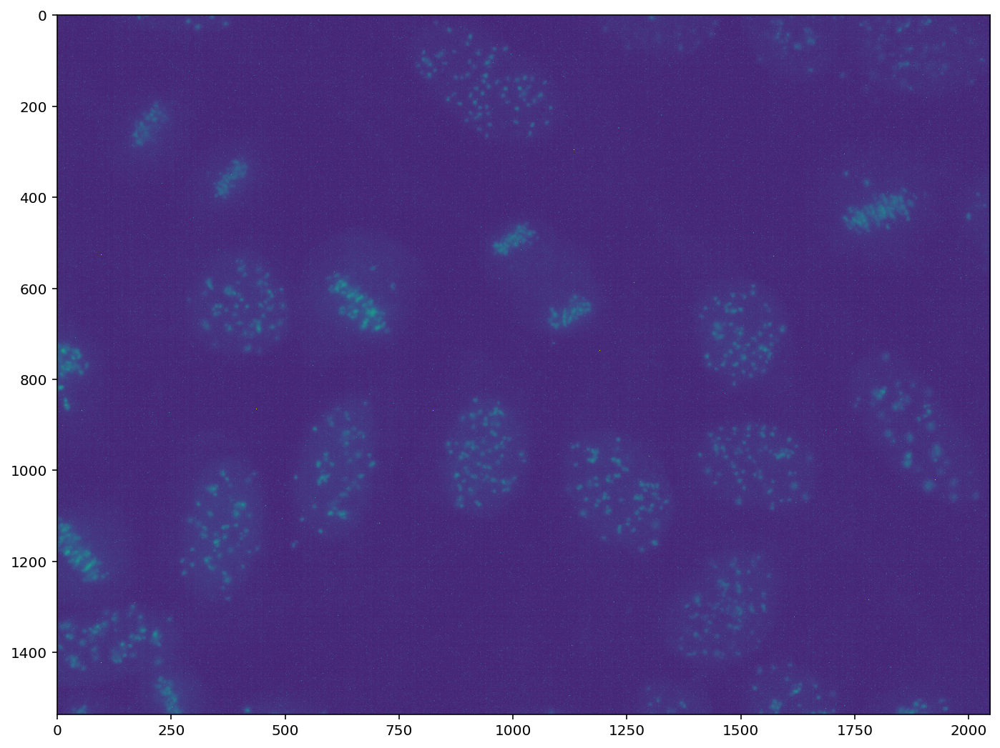

In [36]:
xd = load_img(class_files['ACA'][0])
plt.imshow(xd)

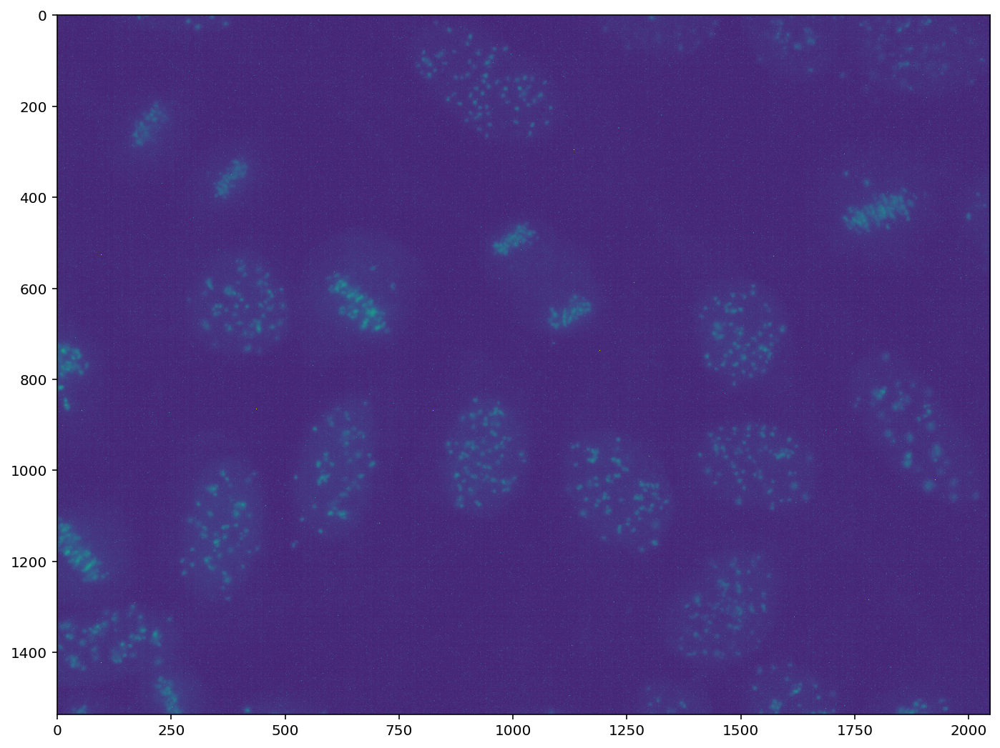

In [38]:
aaa = Image.fromarray(xd)
plt.imshow(aaa)

## masking ZIA class

In [12]:
old_zia_files = glob.glob(old_data_dir + '/ziarnisty/*')
new_zia_files = glob.glob(new_data_dir + '/ziarnisty/*')

zia_files = old_zia_files + new_zia_files
print(f'old files count: {len(old_zia_files)}')
print(f'new files count: {len(new_zia_files)}')
print(f'total files count: {len(zia_files)}')

zia_imgs = [load_img(f, size=IMG_SIZE, top_margin=TAG_MARGIN) for f in zia_files[:FILES_PER_CLASS]]

old files count: 492
new files count: 102
total files count: 594


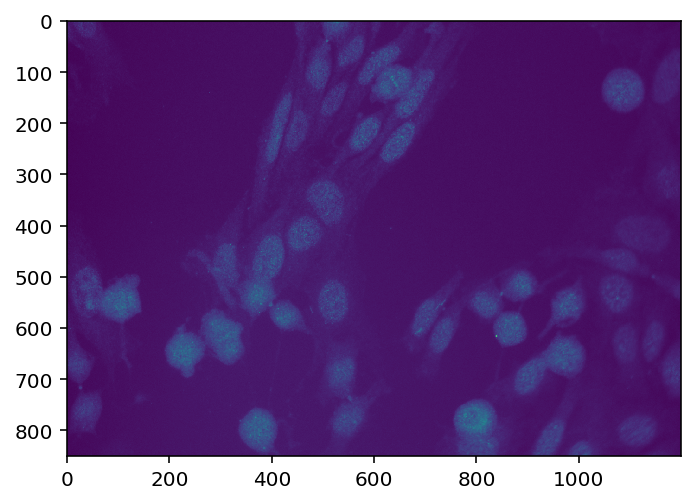

In [15]:
plt.imshow(zia_imgs[0])

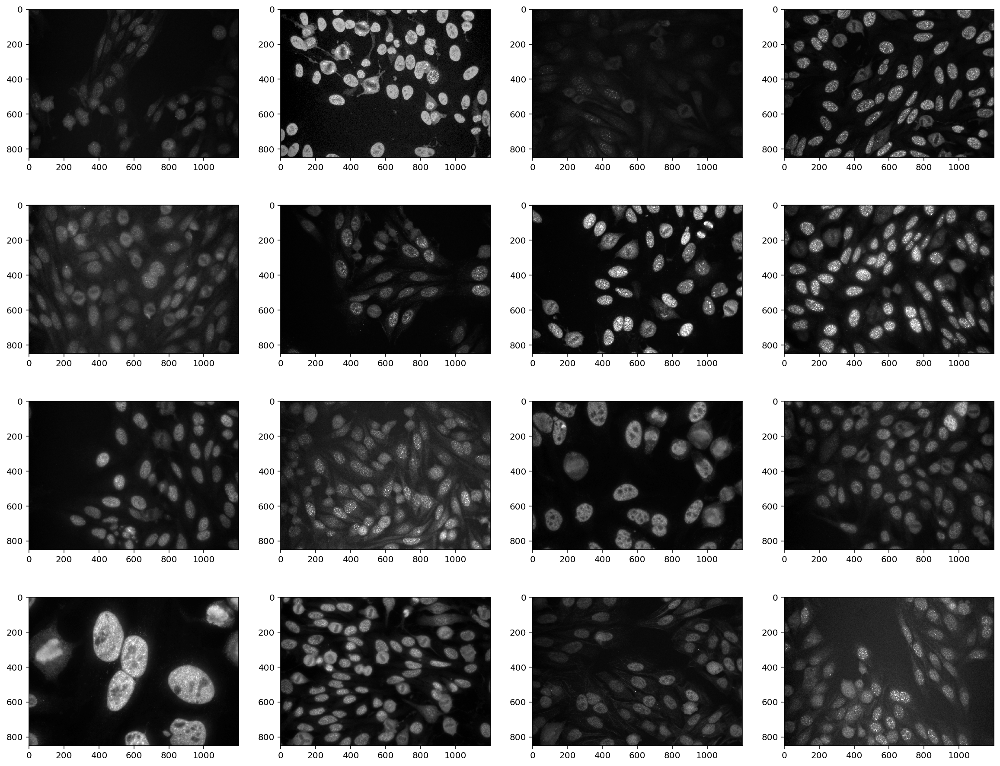

In [14]:
plt.figure(figsize=(20, 16))
grid_plot(zia_imgs, 4, 4, method='imshow', cmap='gray')

## detecting ROI (regions of interest)

In [9]:
def to_windowed(arr, window_size, stride, flatten=True):
    arr_h, arr_w = arr.shape[:2]
    res_h = (arr_h - window_size) // stride + 1
    res_w = (arr_w - window_size) // stride + 1
    
    res = np.zeros((res_h, res_w, window_size, window_size))
    if flatten:
        res = res.reshape(res_h, res_w, -1)
        
    for h in range(res_h):
        for w in range(res_w):
            h_start = h * stride
            h_end = h * stride + window_size
            w_start = w * stride
            w_end = w * stride + window_size
            
            window = arr[h_start:h_end, w_start:w_end]
            if flatten:
                window = window.reshape(-1)
            res[h, w] = window
            
    return res

def resize_binary_mask(mask, target_size):
    mask = Image.fromarray(mask)
    mask = mask.resize(target_size)
    return np.array(mask)

CPU times: user 19.3 s, sys: 3.1 s, total: 22.4 s
Wall time: 22.4 s


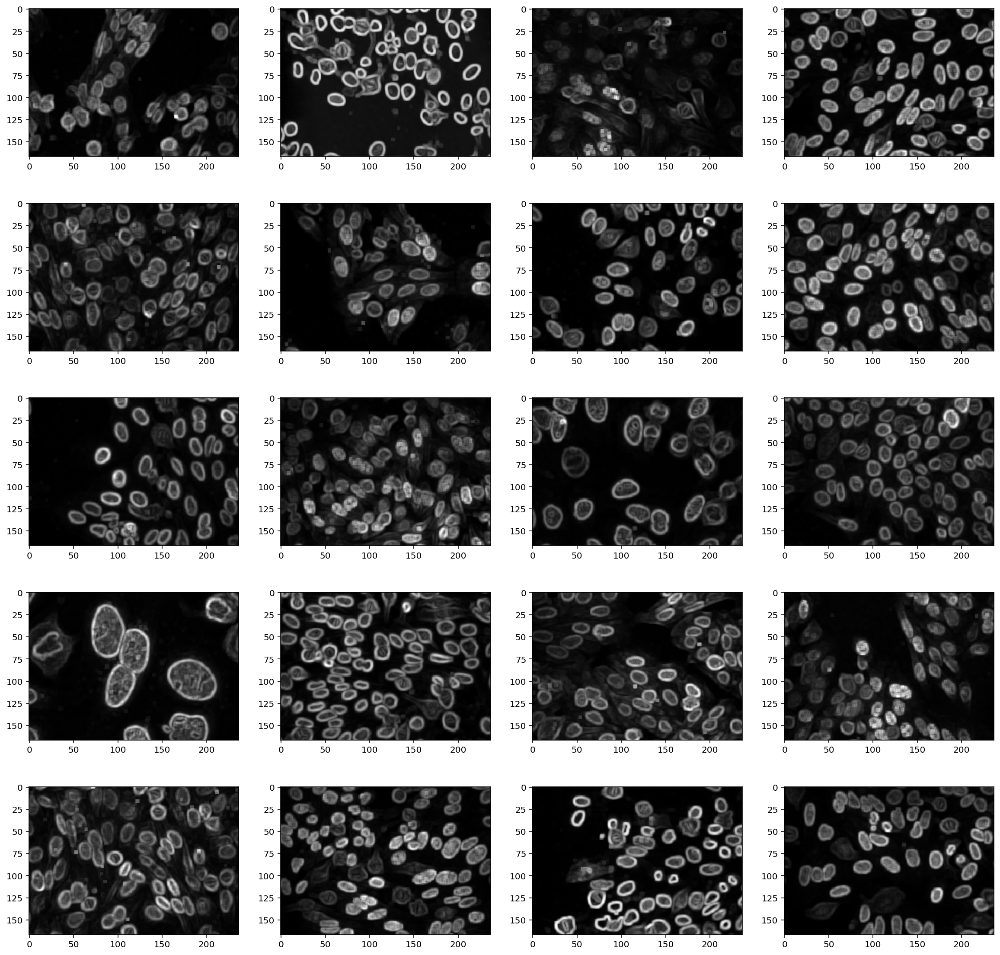

In [18]:
%%time

samples_std = []
std_th = 1.5
window_size = 20
stride = 5

for s in zia_imgs:
    s_windowed = utils.to_windowed(s, window_size=window_size, stride=stride)
    s_std = np.std(s_windowed, axis=2)
    samples_std.append(s_std)
    
    
plt.figure(figsize=(20, 20))
grid_plot(samples_std, 5, 4, 'imshow', cmap='gray')

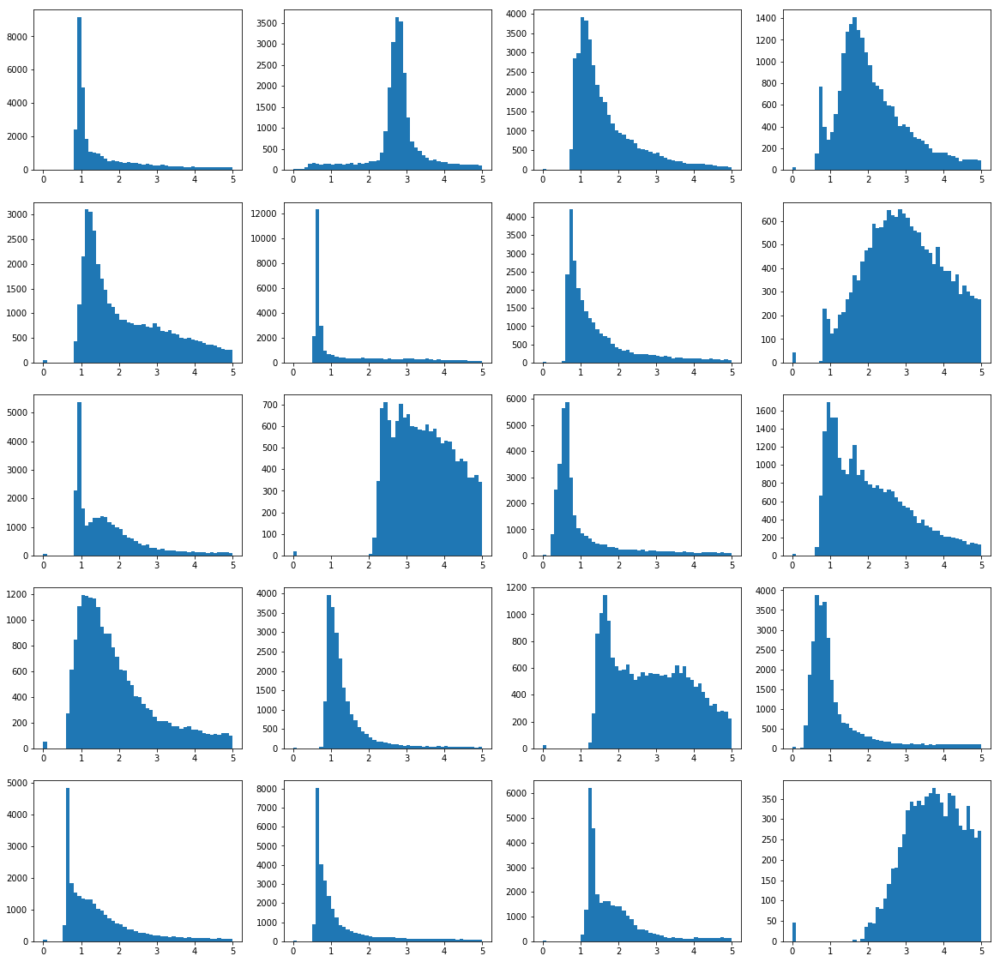

In [11]:
flattened_std = [s.reshape(-1) for s in samples_std]

plt.figure(figsize=(20, 20))
grid_plot(flattened_std, 5, 4, 'hist', bins=50, range=(0, 5))

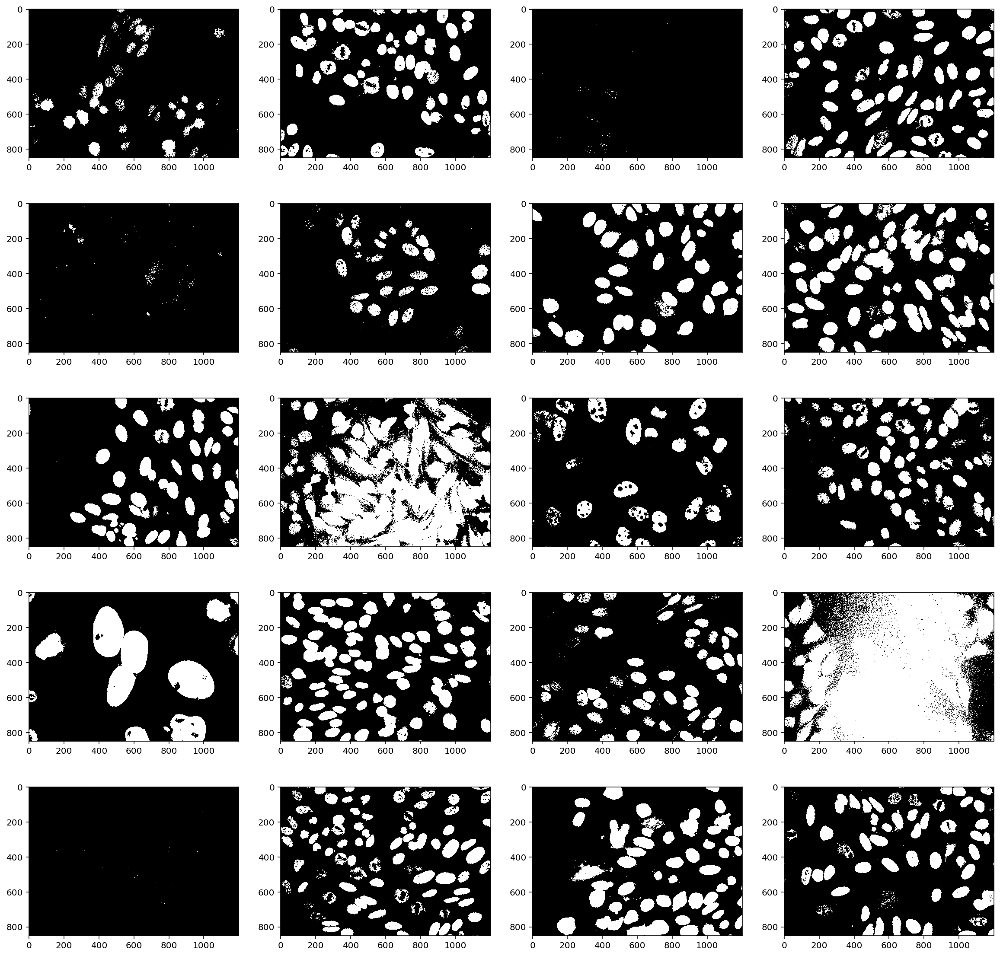

In [21]:
std_th = 50
std_masks = [s > std_th for s in zia_imgs]

plt.figure(figsize=(20, 20))
grid_plot(std_masks, 5, 4, 'imshow', cmap='gray')

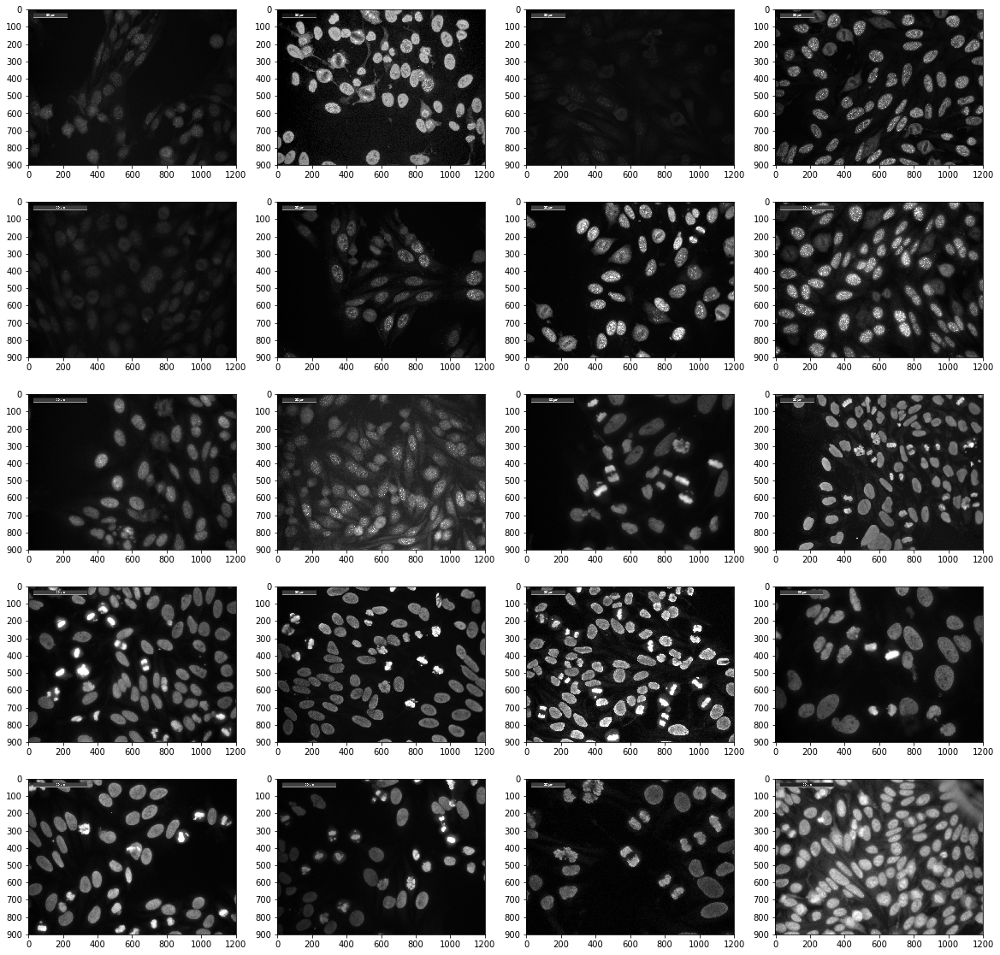

In [13]:
plt.figure(figsize=(20, 20))
grid_plot(samples, 5, 4, 'imshow', cmap='gray')

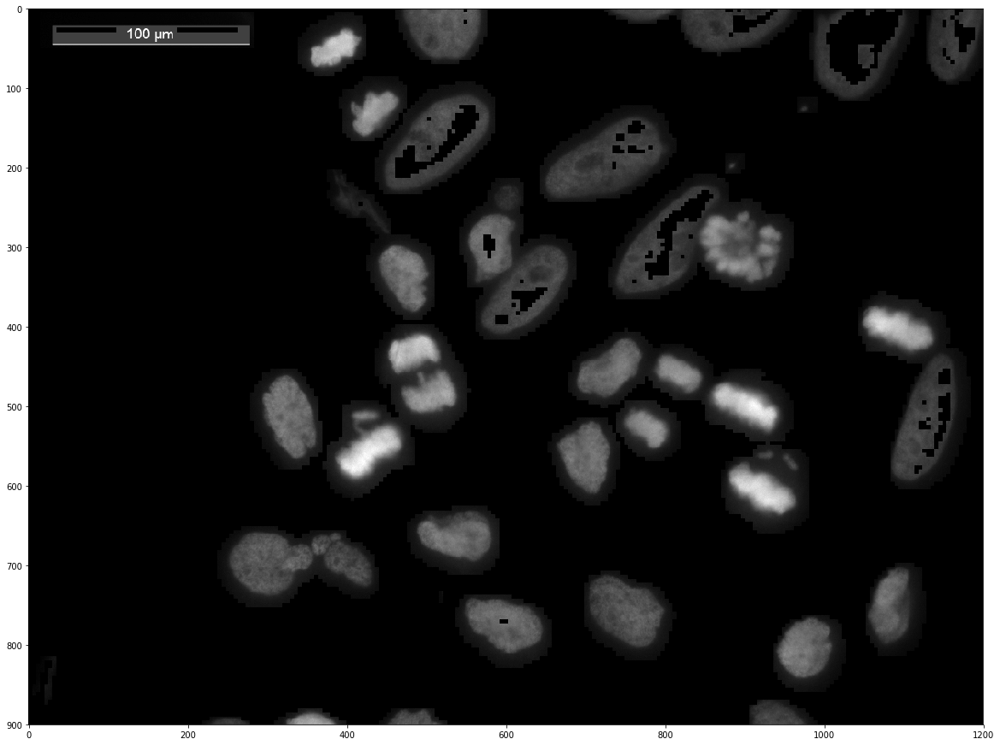

In [42]:
idx = 10
h, w = samples[0].shape
mask_res = resize_binary_mask(std_masks[idx], (w, h))

negate = 0
if negate:
    mask_res = np.logical_not(mask_res)

plt.figure(figsize=(20, 20))
plt.imshow(samples[idx] * mask_res, cmap='gray')